# Stage-Two Filamentary Coil Optimization in DESC
This notebook will show how to use DESC to perform stage two coil optimization with filamentary coils of differing parameterizations: Fourier in terms of arbitrary angle (as pioneered by FOCUS [1]). We will find a coilset for the precise QA [2] vacuum equilibrium, starting from an initial coilset composed of circular planar coils, first with only coils parameterized by a Fourier series in an arbitrary curve parameter, and then again with a coilset composed of various coil parameterizations. Once optimized, the normal field error will be assessed, and field line tracing will be performed to compare the Poincare trace to the equilibrium flux surfaces.


[1]: Zhu, C., Hudson, S. R., Song, Y. & Wan, Y. New method to design stellarator coils without the winding surface. Nucl. Fusion 58, 016008 (2018).

[2]: M. Landreman. & E. Paul. 2022 Physical Review Letters

## Coil Optimization Algorithm and Metrics




# Precise QA Coil Optimization

In [2]:
import numpy as np
from desc.coils import  CoilSet, FourierPlanarCoil
from desc.examples import get
from desc.plotting import plot_surfaces, plot_2d, plot_3d, plot_coils
from desc.grid import LinearGrid
## load in the equilibrium
eq = get("precise_QA")

## make initial coilset
# we will initialize with circular coils centered on the equilibriu axis
# and with their normal oriented along the axis tangent vector.
r1=0.3
minor_radius = eq.compute("a")["a"]
num_coils = 6 # number of coils per half field period

zeta = np.linspace(0, np.pi / eq.NFP, num_coils, endpoint=False) + np.pi / (
     2*eq.NFP * num_coils
)
grid = LinearGrid(rho=[0.0], M=0, zeta=zeta, NFP=eq.NFP)
data_center = eq.axis.compute("x", grid=grid, basis="rpz")
data_normal = eq.compute("e_zeta", grid=grid,basis="rpz")

centers = data_center["x"]
normals = data_normal["e_zeta"]

unique_coils = []
for k in range(num_coils):
    coil = FourierPlanarCoil(
        current=1e6,
        center=centers[k, :],
        normal=normals[k, :],
        r_n=[0, minor_radius + r1, 0],
        basis="rpz" # we are giving the center and normal in cylindrical
    )
    coil = coil.to_FourierXYZ(N=10) # fit with 10 fourier coefficients per coil
    unique_coils.append(coil)
coilset = CoilSet(
    unique_coils, NFP=int(eq.NFP), sym=eq.sym
) 
#TODO: this unfortunately gives the phi=0 sym plane warning

# visualize the initial coilset
fig = plot_3d(eq,"R")
plot_coils(coilset, fig=fig)


/Users/dpanici/Research/DESC/desc/utils.py:541: UserWarning:

coil 0 crosses the symmetry plane phi=0, it is recommended to check the coil-coil separation with method``compute_minimum_intercoil_distance`` to ensure the coils do not overlap after rotation and reflection.

/Users/dpanici/Research/DESC/desc/utils.py:541: UserWarning:

coil 5 crosses the phi=2pi/4 symmetry plane for NFP=2 and sym=True,it is recommended to check the coil-coil separation with method``compute_minimum_intercoil_distance`` to ensure the coils do not overlap after rotation.



In [21]:
from desc.objectives import (ObjectiveFunction, CoilCurvature, CoilLength, CoilTorsion, CoilsetMinDistance, PlasmaCoilsetMinDistance, QuadraticFlux, FixCoilCurrent)
from desc.optimize import Optimizer

# setup optimization problem
coilgrid = LinearGrid(N=25) # grid to discretize coils with

# define our objective function
obj = ObjectiveFunction(
    (QuadraticFlux(eq,
                   field=coilset,
                   eval_grid = LinearGrid(M=25,N=25,NFP=eq.NFP,sym=True),# grid of points on plasma surface to evaluate normal field error
                   field_grid=coilgrid, 
                   vacuum=True,# vacuum=True means we won't calculate the plasma contribution to B as it is zero
                   weight=2e2), 
    # PlasmaCoilsetMinDistance(eq, coilset,
    #                          bounds=(0.5, np.inf),
    #                          plasma_grid = LinearGrid(M=15,N=15,NFP=eq.NFP),
    #                          coil_grid=coilgrid,
    #                          eq_fixed=True,# Fix the equilibrium. For single stage optimization, this would be False 
    #                          weight=10), 
    CoilsetMinDistance(coilset,
                       bounds=(0.2,np.inf),
                       weight=100
                       ),
    CoilLength(coilset,
               target = 1.75*np.pi*minor_radius), # 2.25 * np.pi * minor_radius was pretty good but coils were bad
    CoilCurvature(coilset, 
                  bounds=(0,1),
                  weight=100),
    
                    )
)

## define our constraints
# we will constrain the current of one coil to avoid the trivial quadratic flux minimizing solution
# of zero coil current 
coil_indices_to_fix_current = [False for c in coilset]
coil_indices_to_fix_current[0] = True # 
constraints = (FixCoilCurrent(coilset, indices=coil_indices_to_fix_current),)

optimizer = Optimizer("lsq-exact")

(optimized_coilset,), _ = optimizer.optimize(coilset, objective=obj, constraints=constraints, maxiter=75, ftol=1e-5, verbose=3, copy=True)



Building objective: Quadratic flux
Precomputing transforms
Timer: Precomputing transforms = 74.4 ms
Building objective: coil-coil minimum distance
Building objective: coil length
Precomputing transforms
Timer: Precomputing transforms = 3.63 ms
Building objective: coil curvature
Precomputing transforms
Timer: Precomputing transforms = 4.26 ms
Timer: Objective build = 324 ms
Building objective: fixed coil current
Building objective: fixed shift
Building objective: fixed rotation
Timer: Objective build = 56.2 ms
Timer: Linear constraint projection build = 958 ms
Number of parameters: 383
Number of objectives: 1662
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          2.143e+07                                    6.735e+07   
       1              2          9.800e+05      2.045e+07      5.981e+05      6.909e+06   
       2              4          2.527e+05      7.273e+05     

In [22]:
# visualize the optimized coilset and the normal field error
fig = plot_3d(eq.surface,"B*n",field=optimized_coilset, field_grid = coilgrid)

plot_coils(optimized_coilset, fig=fig,color="red")


/Users/dpanici/Research/DESC/desc/utils.py:541: UserWarning:

coil 0 crosses the symmetry plane phi=0, it is recommended to check the coil-coil separation with method``compute_minimum_intercoil_distance`` to ensure the coils do not overlap after rotation and reflection.

/Users/dpanici/Research/DESC/desc/utils.py:541: UserWarning:

coil 5 crosses the phi=2pi/4 symmetry plane for NFP=2 and sym=True,it is recommended to check the coil-coil separation with method``compute_minimum_intercoil_distance`` to ensure the coils do not overlap after rotation.



In [23]:
# Field line integration (on a CPU this can take a few minutes)
from desc.magnetic_fields import field_line_integrate
rho = np.linspace(0,1,10,endpoint=True)

ntransit = 100  # how many turns
nplanes = 6  # how many places within 1 field period do we want output


# for starting locations we'll pick positions on flux surfaces on the outboard midplane
grid_trace = LinearGrid(rho=np.linspace(0, 1, 9))
r0 = eq.compute("R", grid=grid_trace)["R"]
z0 = eq.compute("Z", grid=grid_trace)["Z"]
phis = (
    np.linspace(0, 2 * np.pi / eq.NFP, nplanes, endpoint=False)
    + np.arange(0, ntransit)[:, None] * 2 * np.pi / eq.NFP
).flatten()
import time
t1 = time.time()
fieldR, fieldZ = field_line_integrate(
    r0=r0,
    z0=z0,
    phis=phis,
    field=optimized_coilset,
    bounds_R = (0.5,1.5),
    bounds_Z=(-1,1)
)
print(f"field line integration took {time.time()-t1:1.3e} seconds")

field line integration took 5.060e+00 seconds


In [24]:
zs = fieldZ.reshape((ntransit, nplanes, -1))
rs = fieldR.reshape((ntransit, nplanes, -1))

if eq.Psi < 0:  # field lines are traced backwards when toroidal field < 0
    rs, zs = rs[:, :: int(np.sign(eq.Psi))], zs[:, :: int(np.sign(eq.Psi))]
    rs, zs = np.roll(rs, 1, 1), np.roll(zs, 1, 1)

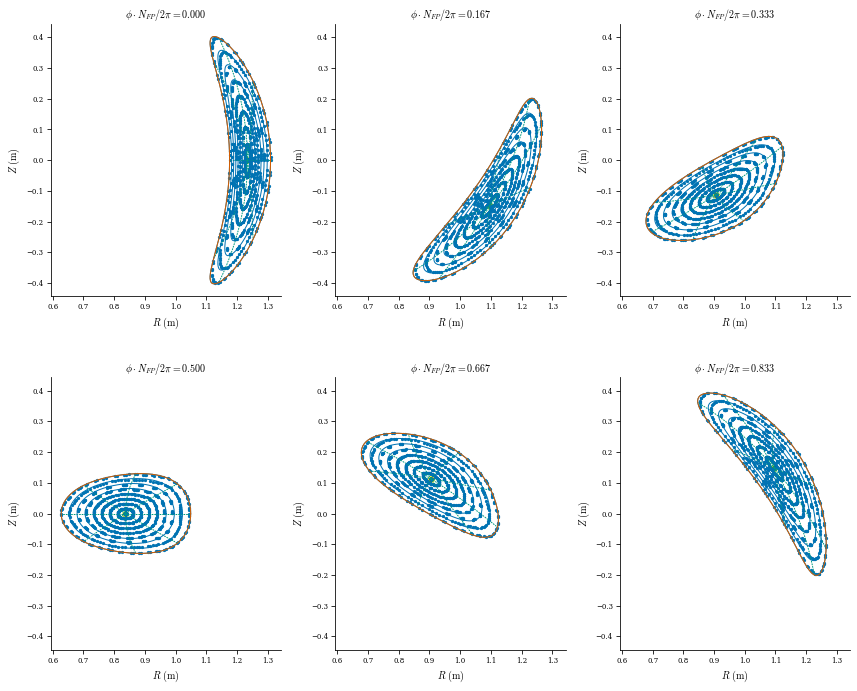

In [25]:
fig, ax = plot_surfaces(eq)
ax = ax.flatten()

for i in range(nplanes):
    ax[i].scatter(rs[:, i, :], zs[:, i, :], s=5)